In [1]:
from __future__ import print_function, division
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import datanewn as dt
import model_4_o as md
import copy
from pytorch_ssim import ssim
from pytorch_ssim import msssim
from torch.utils.data import DataLoader, ConcatDataset
import csvgenerator as csvg
import os
import model_ResUGAN as GAN
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
import tensorboard_logger 
from tensorboard_logger import configure, log_value
import csv
import csvgenerator as csvg
# e/d + i
# best mode so far

In [13]:
# print gpu
torch.cuda.set_device(1)
currentDevice = torch.cuda.current_device()
print("Current GPU: " + str(currentDevice))
print("Total Number of GPUs: " + str(torch.cuda.device_count()))
print("Device Capability: " + str(torch.cuda.get_device_capability(currentDevice)))
print("Device Name: " + str(torch.cuda.get_device_name(currentDevice)))
print("Torch Version: " + torch.__version__)

Current GPU: 1
Total Number of GPUs: 8
Device Capability: (6, 1)
Device Name: GeForce GTX 1080 Ti
Torch Version: 1.0.0


In [14]:
USE_GPU = 1
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:1')
else:
    device = "cpu"
print(device)

cuda:1


In [15]:
# generate csv file, run only for the first time
# csvg.generate_csv()

In [16]:
csvFilePath = csvg.get_csv_path()
print(csvFilePath)
transformed_dataset = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),                                     
                                               dt.Normalize(),
                                               dt.ToTensor()
                                           ]))
# TODO: change the normalization parameters

/deepdata/adib/HEtoSHG/cs766/Data/image_files.csv


In [17]:
# batchsize 32->16
dataloader = DataLoader(transformed_dataset, batch_size=600,
                        shuffle=True, num_workers=0)
print(len(transformed_dataset))

1004324


In [5]:
#--------
# GAN
#--------
cwd = os.getcwd();
save_path = os.path.join(cwd, 'Best model','GAN_output')
CSV_log = os.path.join(save_path,'TrainingLog.csv')
CSV_epoch=os.path.join(save_path, 'EpochLog.csv')

In [6]:
# load and configure generator
path = os.path.join(cwd, 'Best model', 'GAN_output', 'trained_generator.pth')
model = md.Net()
gpu_ids = [1, 2, 3, 4, 5, 6]
torch.cuda.set_device(gpu_ids[0])
model = torch.nn.DataParallel(model, device_ids=gpu_ids)
model.load_state_dict(torch.load(path))
model.eval()

DataParallel(
  (module): Net(
    (block0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.1)
    )
    (block1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.1)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.1)
    )
    (info1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.1)
    )
    (block2): Sequential(
      (0): Co

In [ ]:
# # load and configure generator
# Save_generator_path=os.path.join(save_path,'trained_generator.pth')
# model = md.Net()
# gpu_ids = [1, 2, 3, 4, 5, 6]
# torch.cuda.set_device(gpu_ids[0])
# model = torch.nn.DataParallel(model, device_ids=gpu_ids)
# model.load_state_dict(torch.load(Save_generator_path))
# model.eval()

In [7]:
generator = model.cuda()
# configure discriminator
imgshape = (96, 96)
patch = (1, 96 // 2 ** 4, 96 // 2 ** 4)
discriminator = GAN.DiscriminatorPix()
discriminator = torch.nn.DataParallel(discriminator, device_ids=gpu_ids)
discriminator = discriminator.cuda()

In [8]:
# configure loss functions
criterionL = nn.L1Loss()
criterionL = criterionL.cuda()
criterionMSE = nn.MSELoss()
criterionMSE = criterionMSE.cuda()

In [9]:
# configure training loop
def trainMS(epoch, p, windowsize):
    epoch_loss_G = 0
    epoch_loss_D = 0
    
    for iteration, batch in enumerate(dataloader):
        input, target = batch['input'].to(device), batch['output'].to(device)
        
        imgs_input = Variable(input.type(Tensor))
        imgs_target = Variable(target.type(Tensor))
        
        valid = Variable(Tensor(np.ones((imgs_input.size(0), *patch))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((imgs_input.size(0), *patch))), requires_grad=False)
        
        #--------
        # train generator
        #--------
        optimizer_G.zero_grad()
        
        gen_target = generator(imgs_input)
        gen_target3d = torch.ones((56, 3, 128, 128), dtype=torch.float)
        gen_target3d = torch.cat((gen_target, gen_target, gen_target),1)
#         print(gen_target3d.size())
        
        # adversarial loss
        predictions = discriminator(gen_target3d, imgs_input)
        lossGAN = criterionMSE(predictions, valid)
        
        # content loss
        targetf = target.float()
        targetf = targetf[:, None]
        lossL1 = criterionL(gen_target, targetf)
        lossSSIM = 1-ssim(gen_target, targetf, window_size=windowsize)
        lossContent = p*lossL1 + (1-p)*lossSSIM
        
        # total loss
        loss_G = 100*lossContent + lossGAN
        
        loss_G.backward()
        optimizer_G.step()
        
        
        if iteration%50 == 0:
        #--------
        # train discriminator
        #--------
            optimizer_D.zero_grad()
        
        # loss of real and fake images
            target3d = torch.ones((56, 3, 128, 128), dtype=torch.float)
            target3d = torch.cat((targetf, targetf, targetf),1)
            loss_real = criterionMSE(discriminator(target3d, imgs_input), valid)
            loss_fake = criterionMSE(discriminator(gen_target3d.detach(), imgs_input), fake)
        
        # Total loss
            loss_D = (loss_real + loss_fake) / 2       
        
            loss_D.backward()
            optimizer_D.step()
        if loss_D.item() < 0.1:
            discriminator.apply(GAN.weights_init_normal)
        
        epoch_loss_G = epoch_loss_G + loss_G
        epoch_loss_D = epoch_loss_D + loss_D
        
        
        if iteration%50 == 0:
            print("Dloss: " + str(loss_D.item()) + " Gloss: " + str(loss_G.item()) + 
               "    L1: " + str(lossL1.item()) + "    SSIM: " + str(lossSSIM.item()))
            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(dataloader), loss_G.item()))
            row = ["Dloss", str(loss_D.item()), " Gloss", str(loss_G.item()), "L1_Loss", str(lossL1.item()), "SSIM_Loss", str(lossSSIM.item())]
            with open(CSV_log, 'w')  as csv_log:
                 writer=csv.writer(csv_log)
                 writer.writerows(row)

    print("===> Epoch {} Complete: Avg. G Loss: {:.4f}".format(epoch, epoch_loss_G / len(dataloader)))
    print("===> Epoch {} Complete: Avg. D Loss: {:.4f}".format(epoch, epoch_loss_D / len(dataloader)))
    epoch_row = ["Epoch", str(epoch), "Generator_Loss", str(epoch_loss_G / len(dataloader)), "Discriminator_Loss", str(epoch_loss_D / len(dataloader))]

    torch.save(generator.state_dict(), Save_generator_path)
    torch.save(discriminator.state_dict(), Save_discriminator_path)

In [19]:
p = 0.85
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.001, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path,'trained_generator.pth')
Save_discriminator_path=os.path.join(save_path,'trained_discriminator.pth')

Tensor = torch.cuda.FloatTensor
windowsize = 11
for epoch in range(1, 200 + 1):
        
    trainMS(epoch, p, windowsize)

Dloss: 0.7933945655822754 Gloss: 12.040003776550293    L1: 0.05007220804691315    SSIM: 0.4236552119255066
===> Epoch[1](0/1674): Loss: 12.0400
Dloss: 0.6285388469696045 Gloss: 11.489933967590332    L1: 0.05365031957626343    SSIM: 0.4321185350418091
===> Epoch[1](50/1674): Loss: 11.4899
Dloss: 0.4235485792160034 Gloss: 10.768436431884766    L1: 0.05124911665916443    SSIM: 0.40992289781570435
===> Epoch[1](100/1674): Loss: 10.7684
Dloss: 0.37616193294525146 Gloss: 11.371172904968262    L1: 0.05300521105527878    SSIM: 0.4347311854362488
===> Epoch[1](150/1674): Loss: 11.3712
Dloss: 0.32662075757980347 Gloss: 11.090495109558105    L1: 0.05133355036377907    SSIM: 0.4251086115837097
===> Epoch[1](200/1674): Loss: 11.0905
Dloss: 0.31613966822624207 Gloss: 11.242716789245605    L1: 0.052171654999256134    SSIM: 0.4301809072494507
===> Epoch[1](250/1674): Loss: 11.2427
Dloss: 0.302399218082428 Gloss: 11.600083351135254    L1: 0.05511390417814255    SSIM: 0.4373875856399536
===> Epoch[1](30

Dloss: 0.1631787121295929 Gloss: 11.473387718200684    L1: 0.0531250461935997    SSIM: 0.4276847243309021
===> Epoch[2](1100/1674): Loss: 11.4734
Dloss: 0.148722305893898 Gloss: 10.879449844360352    L1: 0.048409849405288696    SSIM: 0.41129791736602783
===> Epoch[2](1150/1674): Loss: 10.8794
Dloss: 0.15113556385040283 Gloss: 10.995760917663574    L1: 0.05032974109053612    SSIM: 0.4153022766113281
===> Epoch[2](1200/1674): Loss: 10.9958
Dloss: 0.14984557032585144 Gloss: 11.678466796875    L1: 0.05358327925205231    SSIM: 0.4345301389694214
===> Epoch[2](1250/1674): Loss: 11.6785
Dloss: 0.14968235790729523 Gloss: 11.352108001708984    L1: 0.05228770524263382    SSIM: 0.42556947469711304
===> Epoch[2](1300/1674): Loss: 11.3521
Dloss: 0.15887224674224854 Gloss: 11.667604446411133    L1: 0.054246459156274796    SSIM: 0.43022477626800537
===> Epoch[2](1350/1674): Loss: 11.6676
Dloss: 0.15079036355018616 Gloss: 11.484803199768066    L1: 0.05335518345236778    SSIM: 0.4293709397315979
===> E

Dloss: 0.1292741298675537 Gloss: 11.76928424835205    L1: 0.05547782778739929    SSIM: 0.4429333209991455
===> Epoch[4](450/1674): Loss: 11.7693
Dloss: 0.1078115925192833 Gloss: 11.57078742980957    L1: 0.05287126824259758    SSIM: 0.429839551448822
===> Epoch[4](500/1674): Loss: 11.5708
Dloss: 0.11106786131858826 Gloss: 12.323348999023438    L1: 0.05691022425889969    SSIM: 0.45222270488739014
===> Epoch[4](550/1674): Loss: 12.3233
Dloss: 0.11656373739242554 Gloss: 11.582358360290527    L1: 0.05347255989909172    SSIM: 0.43282198905944824
===> Epoch[4](600/1674): Loss: 11.5824
Dloss: 0.11816929280757904 Gloss: 11.95840072631836    L1: 0.05578642711043358    SSIM: 0.4364413619041443
===> Epoch[4](650/1674): Loss: 11.9584
Dloss: 0.11780580133199692 Gloss: 11.82522964477539    L1: 0.05407244712114334    SSIM: 0.4438273310661316
===> Epoch[4](700/1674): Loss: 11.8252
Dloss: 0.11345414817333221 Gloss: 11.861808776855469    L1: 0.052794042974710464    SSIM: 0.44594746828079224
===> Epoch[4]

Dloss: 0.5502498149871826 Gloss: 11.749911308288574    L1: 0.0538397878408432    SSIM: 0.43777966499328613
===> Epoch[5](1550/1674): Loss: 11.7499
Dloss: 0.6533788442611694 Gloss: 11.0736722946167    L1: 0.04890242964029312    SSIM: 0.41247308254241943
===> Epoch[5](1600/1674): Loss: 11.0737
Dloss: 0.6812725067138672 Gloss: 11.832555770874023    L1: 0.054152391850948334    SSIM: 0.4318966269493103
===> Epoch[5](1650/1674): Loss: 11.8326
===> Epoch 5 Complete: Avg. G Loss: 11.6351
===> Epoch 5 Complete: Avg. D Loss: 0.8436
Dloss: 0.5476557612419128 Gloss: 10.951172828674316    L1: 0.0498904287815094    SSIM: 0.40648365020751953
===> Epoch[6](0/1674): Loss: 10.9512
Dloss: 0.42002642154693604 Gloss: 11.44683837890625    L1: 0.05375845357775688    SSIM: 0.42655205726623535
===> Epoch[6](50/1674): Loss: 11.4468
Dloss: 0.3982335329055786 Gloss: 10.600118637084961    L1: 0.04881201311945915    SSIM: 0.39915627241134644
===> Epoch[6](100/1674): Loss: 10.6001
Dloss: 0.39366984367370605 Gloss: 1

Dloss: 0.3030864894390106 Gloss: 11.239137649536133    L1: 0.051859259605407715    SSIM: 0.42696917057037354
===> Epoch[7](900/1674): Loss: 11.2391
Dloss: 0.30189815163612366 Gloss: 11.487112045288086    L1: 0.053594060242176056    SSIM: 0.4328577518463135
===> Epoch[7](950/1674): Loss: 11.4871
Dloss: 0.30374613404273987 Gloss: 11.600419044494629    L1: 0.05475325882434845    SSIM: 0.4345139265060425
===> Epoch[7](1000/1674): Loss: 11.6004
Dloss: 0.30738937854766846 Gloss: 10.806812286376953    L1: 0.04931893199682236    SSIM: 0.4112700819969177
===> Epoch[7](1050/1674): Loss: 10.8068
Dloss: 0.3109164834022522 Gloss: 11.380324363708496    L1: 0.053008582442998886    SSIM: 0.4301471710205078
===> Epoch[7](1100/1674): Loss: 11.3803
Dloss: 0.31880128383636475 Gloss: 10.841944694519043    L1: 0.049254920333623886    SSIM: 0.41326379776000977
===> Epoch[7](1150/1674): Loss: 10.8419
Dloss: 0.3309858441352844 Gloss: 11.370757102966309    L1: 0.05205782875418663    SSIM: 0.43284422159194946
==

Dloss: 0.23517706990242004 Gloss: 11.870149612426758    L1: 0.05647198110818863    SSIM: 0.44248199462890625
===> Epoch[9](250/1674): Loss: 11.8701
Dloss: 0.24305307865142822 Gloss: 10.963231086730957    L1: 0.050108060240745544    SSIM: 0.416373610496521
===> Epoch[9](300/1674): Loss: 10.9632
Dloss: 0.230060875415802 Gloss: 11.038612365722656    L1: 0.0502600260078907    SSIM: 0.420009970664978
===> Epoch[9](350/1674): Loss: 11.0386
Dloss: 0.2321082204580307 Gloss: 11.222630500793457    L1: 0.051956020295619965    SSIM: 0.42488521337509155
===> Epoch[9](400/1674): Loss: 11.2226
Dloss: 0.23019400238990784 Gloss: 11.07418441772461    L1: 0.05146363377571106    SSIM: 0.415870726108551
===> Epoch[9](450/1674): Loss: 11.0742
Dloss: 0.2312135100364685 Gloss: 11.2474365234375    L1: 0.052476875483989716    SSIM: 0.422174870967865
===> Epoch[9](500/1674): Loss: 11.2474
Dloss: 0.2303398847579956 Gloss: 10.78640365600586    L1: 0.049679193645715714    SSIM: 0.4067838191986084
===> Epoch[9](550/

Dloss: 0.1939058005809784 Gloss: 11.362236976623535    L1: 0.05265640839934349    SSIM: 0.4233401417732239
===> Epoch[10](1300/1674): Loss: 11.3622
Dloss: 0.18935757875442505 Gloss: 11.382040977478027    L1: 0.05215601995587349    SSIM: 0.427245557308197
===> Epoch[10](1350/1674): Loss: 11.3820
Dloss: 0.1951688975095749 Gloss: 11.579461097717285    L1: 0.05440325289964676    SSIM: 0.43030864000320435
===> Epoch[10](1400/1674): Loss: 11.5795
Dloss: 0.20579928159713745 Gloss: 11.131368637084961    L1: 0.05204351246356964    SSIM: 0.4087790846824646
===> Epoch[10](1450/1674): Loss: 11.1314
Dloss: 0.1916772425174713 Gloss: 11.399651527404785    L1: 0.05259910225868225    SSIM: 0.42670875787734985
===> Epoch[10](1500/1674): Loss: 11.3997
Dloss: 0.19893068075180054 Gloss: 11.034819602966309    L1: 0.05080408230423927    SSIM: 0.41395556926727295
===> Epoch[10](1550/1674): Loss: 11.0348
Dloss: 0.20775015652179718 Gloss: 11.569450378417969    L1: 0.053393397480249405    SSIM: 0.433717548847198

Dloss: 0.16920608282089233 Gloss: 11.89059829711914    L1: 0.05471107363700867    SSIM: 0.44385117292404175
===> Epoch[12](650/1674): Loss: 11.8906
Dloss: 0.163039892911911 Gloss: 11.538220405578613    L1: 0.052860576659440994    SSIM: 0.42914605140686035
===> Epoch[12](700/1674): Loss: 11.5382
Dloss: 0.166454017162323 Gloss: 11.14759635925293    L1: 0.051341462880373    SSIM: 0.41852104663848877
===> Epoch[12](750/1674): Loss: 11.1476
Dloss: 0.26953017711639404 Gloss: 11.594460487365723    L1: 0.0558459535241127    SSIM: 0.4335671067237854
===> Epoch[12](800/1674): Loss: 11.5945
Dloss: 0.26841503381729126 Gloss: 10.953706741333008    L1: 0.04909566789865494    SSIM: 0.4073309302330017
===> Epoch[12](850/1674): Loss: 10.9537
Dloss: 0.19309522211551666 Gloss: 11.426139831542969    L1: 0.052705202251672745    SSIM: 0.43523073196411133
===> Epoch[12](900/1674): Loss: 11.4261
Dloss: 0.18984100222587585 Gloss: 11.527414321899414    L1: 0.05344156175851822    SSIM: 0.4247981905937195
===> Ep

===> Epoch 13 Complete: Avg. G Loss: 11.6660
===> Epoch 13 Complete: Avg. D Loss: 0.1854
Dloss: 0.1968626081943512 Gloss: 11.90079402923584    L1: 0.055028319358825684    SSIM: 0.4392997622489929
===> Epoch[14](0/1674): Loss: 11.9008
Dloss: 0.174538254737854 Gloss: 11.434700965881348    L1: 0.0531766302883625    SSIM: 0.42987197637557983
===> Epoch[14](50/1674): Loss: 11.4347
Dloss: 0.19532915949821472 Gloss: 11.870502471923828    L1: 0.05471137538552284    SSIM: 0.4359689950942993
===> Epoch[14](100/1674): Loss: 11.8705
Dloss: 0.17122656106948853 Gloss: 11.553454399108887    L1: 0.054604385048151016    SSIM: 0.4304615259170532
===> Epoch[14](150/1674): Loss: 11.5535
Dloss: 0.18758909404277802 Gloss: 11.968900680541992    L1: 0.054367415606975555    SSIM: 0.44416433572769165
===> Epoch[14](200/1674): Loss: 11.9689
Dloss: 0.16695547103881836 Gloss: 11.729000091552734    L1: 0.05436770245432854    SSIM: 0.4411202073097229
===> Epoch[14](250/1674): Loss: 11.7290
Dloss: 0.174997478723526 G

Dloss: 0.1537572294473648 Gloss: 12.076443672180176    L1: 0.055269576609134674    SSIM: 0.4500036835670471
===> Epoch[15](1000/1674): Loss: 12.0764
Dloss: 0.16080892086029053 Gloss: 11.52473258972168    L1: 0.053537897765636444    SSIM: 0.4281558394432068
===> Epoch[15](1050/1674): Loss: 11.5247
Dloss: 0.16474655270576477 Gloss: 11.868753433227539    L1: 0.053732264786958694    SSIM: 0.4443720579147339
===> Epoch[15](1100/1674): Loss: 11.8688
Dloss: 0.1594301462173462 Gloss: 11.68523120880127    L1: 0.05410350486636162    SSIM: 0.43769729137420654
===> Epoch[15](1150/1674): Loss: 11.6852
Dloss: 0.16411426663398743 Gloss: 11.810460090637207    L1: 0.0545157864689827    SSIM: 0.43322640657424927
===> Epoch[15](1200/1674): Loss: 11.8105
Dloss: 0.15743237733840942 Gloss: 11.328512191772461    L1: 0.05283965542912483    SSIM: 0.4232127070426941
===> Epoch[15](1250/1674): Loss: 11.3285
Dloss: 0.18468846380710602 Gloss: 11.868895530700684    L1: 0.054045841097831726    SSIM: 0.43836003541946

Dloss: 0.1671697199344635 Gloss: 11.24947452545166    L1: 0.05243272706866264    SSIM: 0.42258763313293457
===> Epoch[17](350/1674): Loss: 11.2495
Dloss: 0.18474090099334717 Gloss: 12.468558311462402    L1: 0.05863405764102936    SSIM: 0.4433351159095764
===> Epoch[17](400/1674): Loss: 12.4686
Dloss: 0.15848581492900848 Gloss: 12.043472290039062    L1: 0.05608823522925377    SSIM: 0.4565045237541199
===> Epoch[17](450/1674): Loss: 12.0435
Dloss: 0.17655456066131592 Gloss: 11.97909164428711    L1: 0.053863439708948135    SSIM: 0.4362766742706299
===> Epoch[17](500/1674): Loss: 11.9791
Dloss: 0.1460876762866974 Gloss: 11.187954902648926    L1: 0.051276154816150665    SSIM: 0.4234209656715393
===> Epoch[17](550/1674): Loss: 11.1880
Dloss: 0.1408633589744568 Gloss: 11.730676651000977    L1: 0.05382360890507698    SSIM: 0.4353010058403015
===> Epoch[17](600/1674): Loss: 11.7307
Dloss: 0.15138718485832214 Gloss: 11.574420928955078    L1: 0.052139416337013245    SSIM: 0.4361337423324585
===> 

Dloss: 0.13468903303146362 Gloss: 11.667167663574219    L1: 0.052794937044382095    SSIM: 0.4400979280471802
===> Epoch[18](1400/1674): Loss: 11.6672
Dloss: 0.13215437531471252 Gloss: 12.111987113952637    L1: 0.05534445121884346    SSIM: 0.448294997215271
===> Epoch[18](1450/1674): Loss: 12.1120
Dloss: 0.12961795926094055 Gloss: 11.928465843200684    L1: 0.054716333746910095    SSIM: 0.43981385231018066
===> Epoch[18](1500/1674): Loss: 11.9285
Dloss: 0.13194450736045837 Gloss: 11.99538516998291    L1: 0.056032754480838776    SSIM: 0.442290723323822
===> Epoch[18](1550/1674): Loss: 11.9954
Dloss: 0.14354129135608673 Gloss: 11.648804664611816    L1: 0.0529642328619957    SSIM: 0.42672204971313477
===> Epoch[18](1600/1674): Loss: 11.6488
Dloss: 0.14627888798713684 Gloss: 11.843701362609863    L1: 0.05449282005429268    SSIM: 0.44821101427078247
===> Epoch[18](1650/1674): Loss: 11.8437
===> Epoch 18 Complete: Avg. G Loss: 11.7913
===> Epoch 18 Complete: Avg. D Loss: 0.1450
Dloss: 0.166665

KeyboardInterrupt: 

In [29]:
p = 0.85
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.001, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path,'trained_generator.pth')
Save_discriminator_path=os.path.join(save_path,'trained_discriminator.pth')

Tensor = torch.cuda.FloatTensor
windowsize = 11
for epoch in range(1, 200 + 1):
        
    trainMS(epoch, p, windowsize)

Dloss: 0.14204882085323334 Gloss: 18.1884708404541    L1: 0.08289831131696701    SSIM: 0.7040908336639404
===> Epoch[1](0/325): Loss: 18.1885
Dloss: 0.1429399847984314 Gloss: 17.728593826293945    L1: 0.08062616735696793    SSIM: 0.6782324910163879
===> Epoch[1](50/325): Loss: 17.7286
Dloss: 0.14679162204265594 Gloss: 17.7934513092041    L1: 0.08117308467626572    SSIM: 0.6852915287017822
===> Epoch[1](100/325): Loss: 17.7935
Dloss: 0.11453481018543243 Gloss: 17.78949737548828    L1: 0.08126908540725708    SSIM: 0.6802517771720886
===> Epoch[1](150/325): Loss: 17.7895
Dloss: 0.13692410290241241 Gloss: 18.154380798339844    L1: 0.08279796689748764    SSIM: 0.6902578473091125
===> Epoch[1](200/325): Loss: 18.1544
Dloss: 0.13746613264083862 Gloss: 17.83894920349121    L1: 0.08161991089582443    SSIM: 0.6843798160552979
===> Epoch[1](250/325): Loss: 17.8389
Dloss: 0.12397630512714386 Gloss: 17.98345375061035    L1: 0.08201443403959274    SSIM: 0.6924009323120117
===> Epoch[1](300/325): Los

KeyboardInterrupt: 

In [22]:
discriminator.apply(GAN.weights_init_normal)

DataParallel(
  (module): DiscriminatorPix(
    (model): Sequential(
      (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.2, inplace)
      (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (6): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (7): LeakyReLU(negative_slope=0.2, inplace)
      (8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (10): LeakyReLU(negative_slope=0.2, inplace)
      (11): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (12): InstanceNorm2d(256, eps=1e-05, momentu

In [11]:
import matplotlib.pyplot as plt
from torchvision import transforms, utils
def test():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader):
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()

            outdataloader = {'input':prediction,'output':target}
            
            print(outdataloader['input'].size(), 
                      outdataloader['output'].size())

            plt.figure()
            input_batch, label_batch = outdataloader['input'], outdataloader['output']
            
            input = input[0:32, :, :, :]
            input_batch = input_batch[0:32, :, :, :]
            label_batch = label_batch[0:32, :, :]
            
            batch_size = 32
            im_size = input_batch.size(2)
            label_batch=label_batch.reshape([batch_size,1,im_size,im_size])
            print(label_batch.size())
#             for img in input_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)
                            
#             for img in label_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)                           
            grid = utils.make_grid(input).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()
    
            grid = utils.make_grid(input_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(label_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))

            plt.axis('off')
            plt.ioff()
            plt.show()
            if iteration == 16:
                break

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


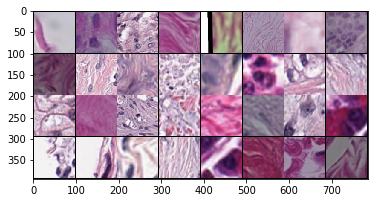

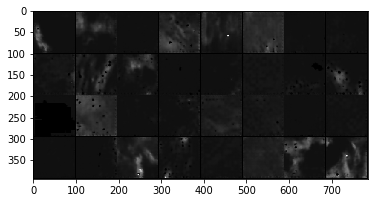

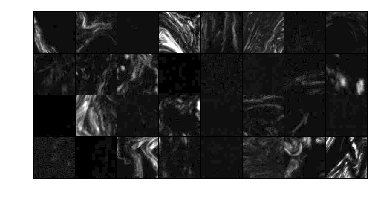

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


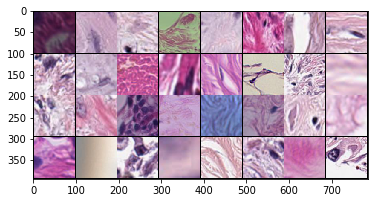

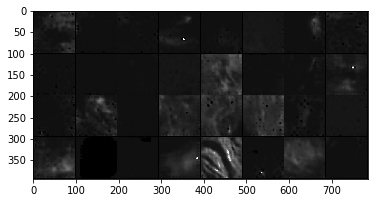

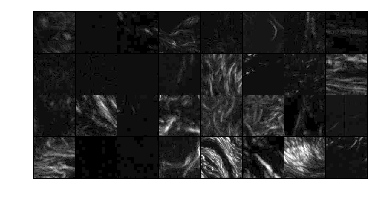

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


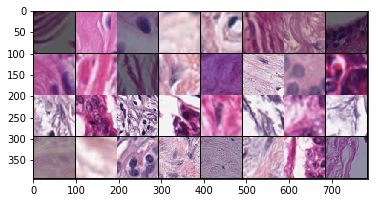

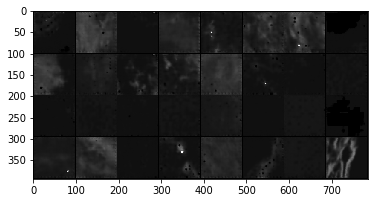

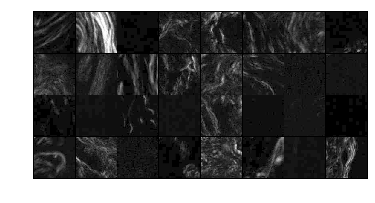

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


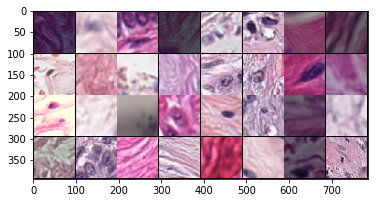

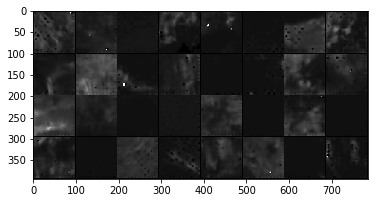

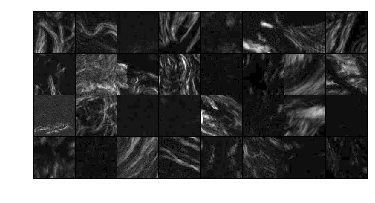

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


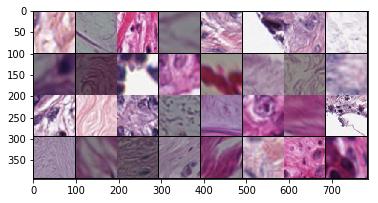

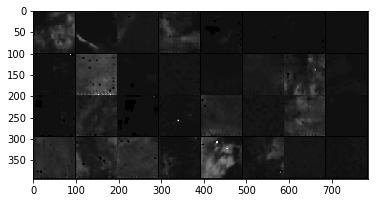

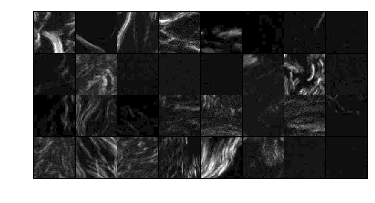

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


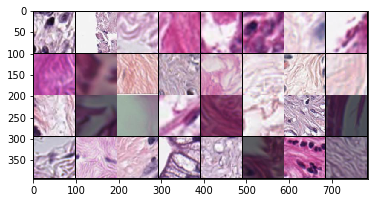

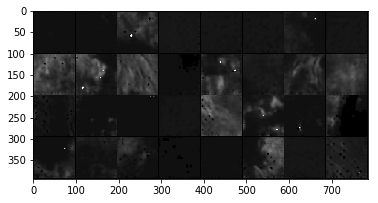

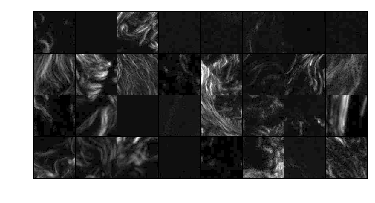

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


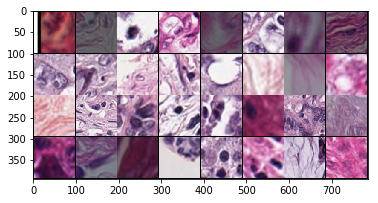

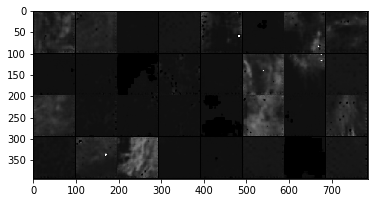

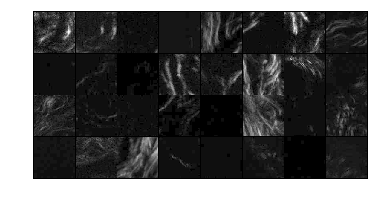

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


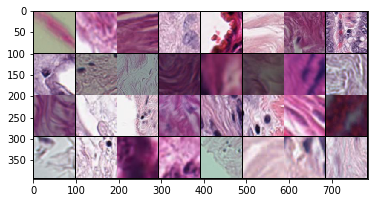

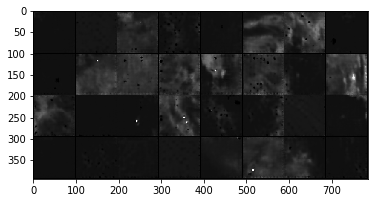

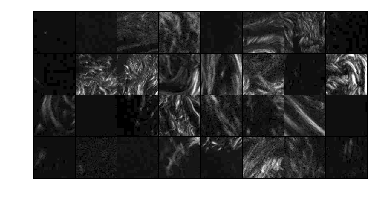

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


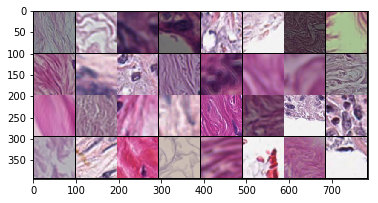

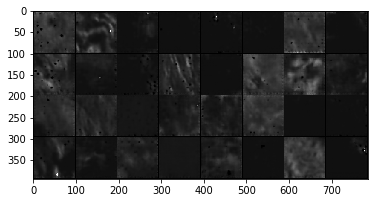

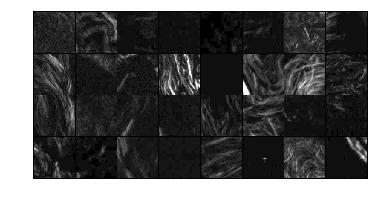

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


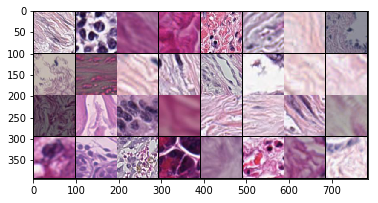

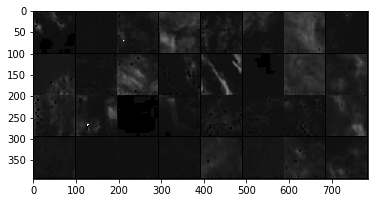

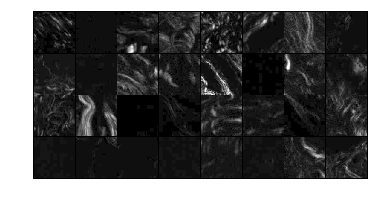

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


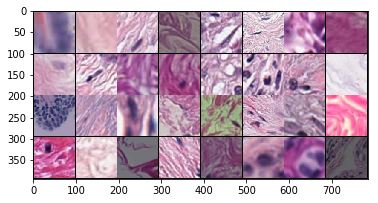

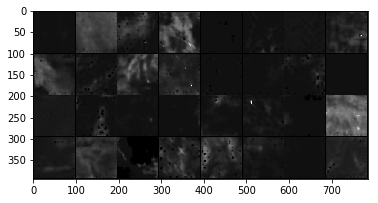

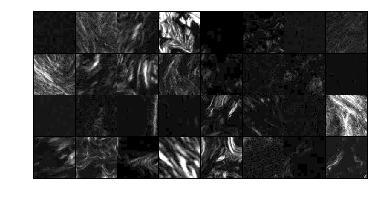

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


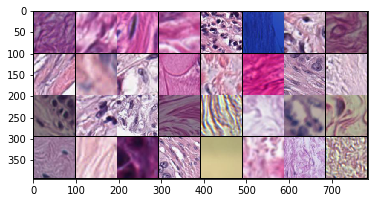

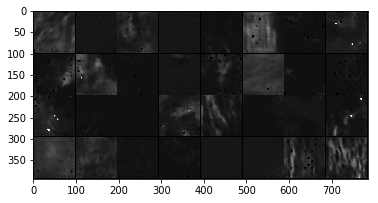

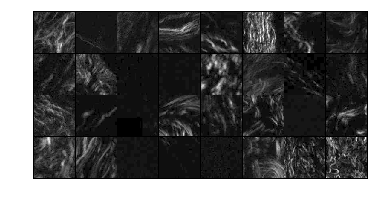

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


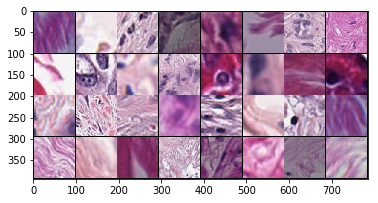

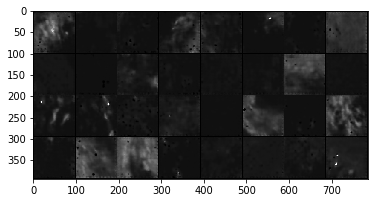

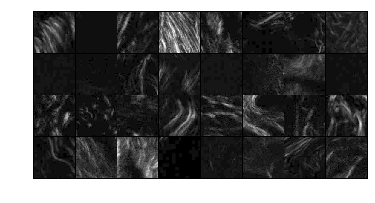

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


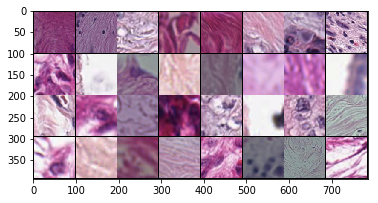

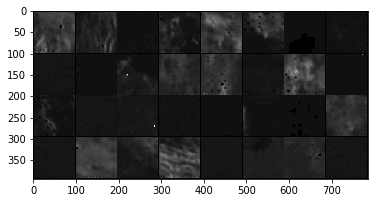

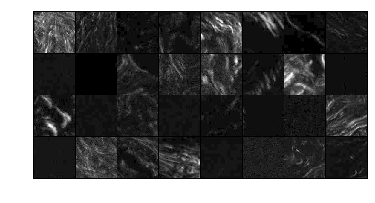

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


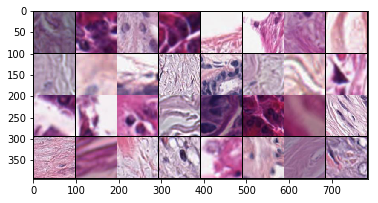

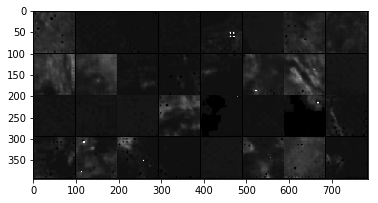

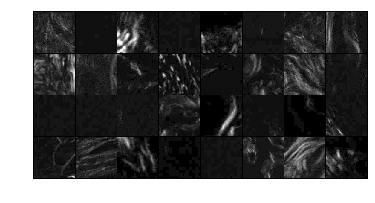

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


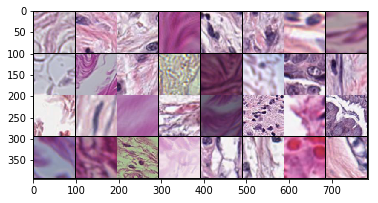

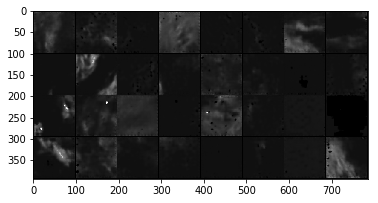

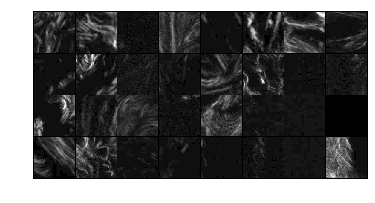

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


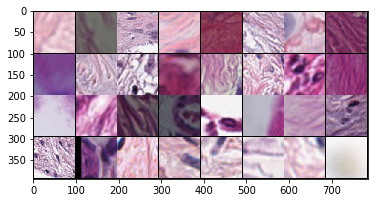

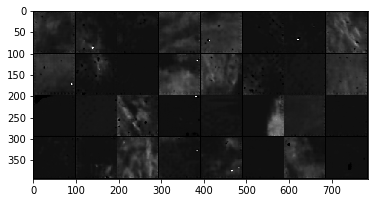

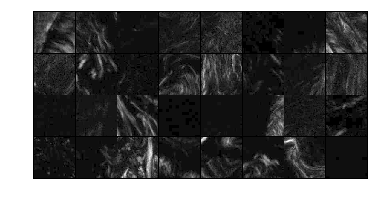

In [20]:
test()

In [26]:
p = 0
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002)
optimizer_D  = torch.optim.Adam(discriminator.parameters(), lr=0.0001)
# generator.apply(md.weights_init_normal)
# discriminator.apply(md.weights_init_normal)
Save_generator_path=os.path.join(save_path,'trained_generator.pth')
Save_discriminator_path=os.path.join(save_path,'trained_discriminator.pth')

Tensor = torch.cuda.FloatTensor
windowsize = 11
for epoch in range(1, 200 + 1):
        
    trainMS(epoch, p, windowsize)

Dloss: 0.22173547744750977 Gloss: 42.675846099853516    L1: 0.05300116539001465    SSIM: 0.42195916175842285
===> Epoch[1](0/1674): Loss: 42.6758
Dloss: 0.9743314981460571 Gloss: 44.70475769042969    L1: 0.0526844747364521    SSIM: 0.42662477493286133
===> Epoch[1](50/1674): Loss: 44.7048
Dloss: 0.2597726583480835 Gloss: 42.90481185913086    L1: 0.05430635064840317    SSIM: 0.4229722023010254
===> Epoch[1](100/1674): Loss: 42.9048
Dloss: 0.5152647495269775 Gloss: 43.581565856933594    L1: 0.05512641742825508    SSIM: 0.43253403902053833
===> Epoch[1](150/1674): Loss: 43.5816
Dloss: 0.5933547616004944 Gloss: 41.7454719543457    L1: 0.052518509328365326    SSIM: 0.4142681360244751
===> Epoch[1](200/1674): Loss: 41.7455
Dloss: 0.41821444034576416 Gloss: 42.488189697265625    L1: 0.052914150059223175    SSIM: 0.4216805696487427
===> Epoch[1](250/1674): Loss: 42.4882
Dloss: 0.2720872759819031 Gloss: 42.10548782348633    L1: 0.0518137626349926    SSIM: 0.4167999029159546
===> Epoch[1](300/16

KeyboardInterrupt: 

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


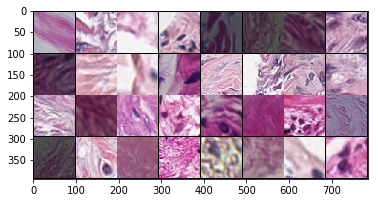

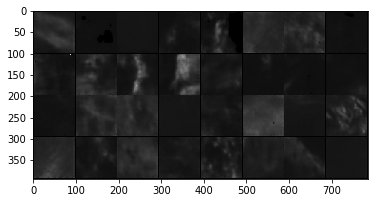

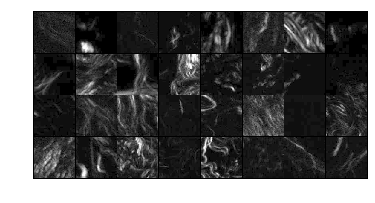

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


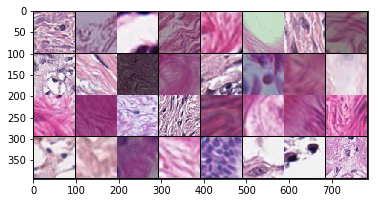

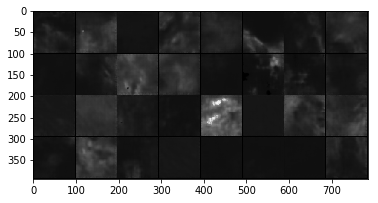

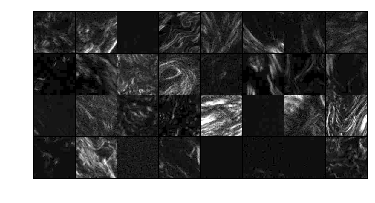

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


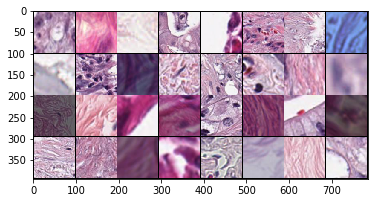

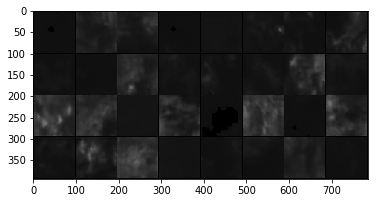

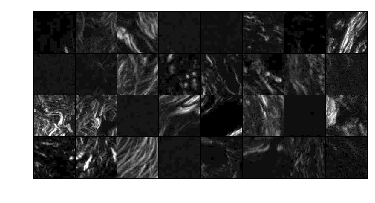

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


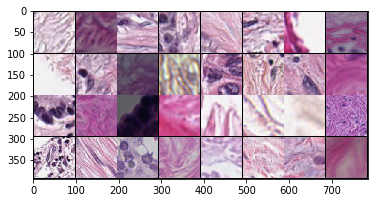

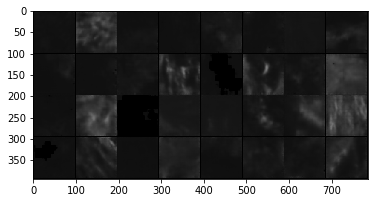

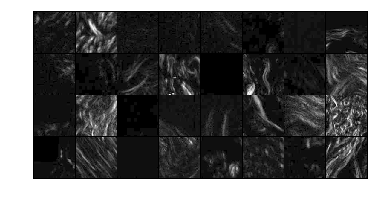

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


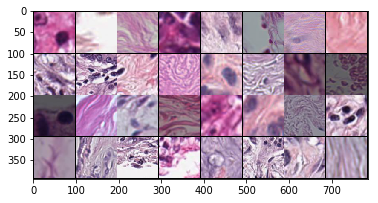

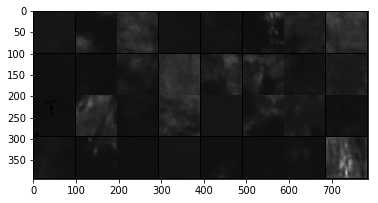

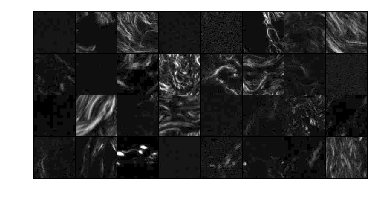

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


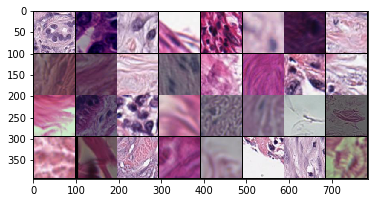

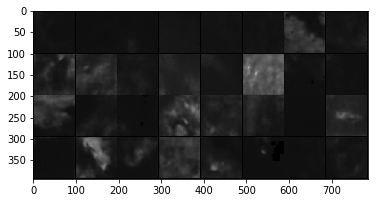

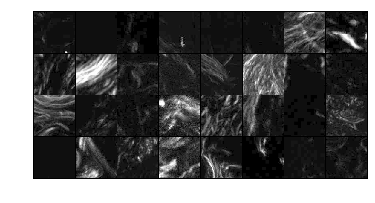

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


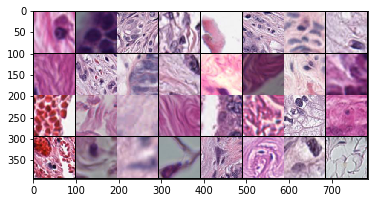

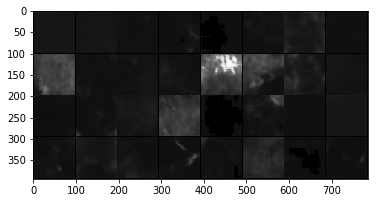

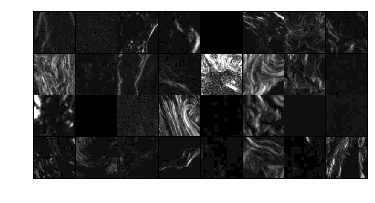

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


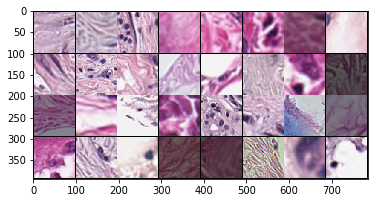

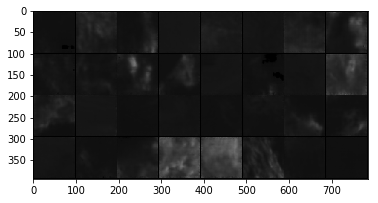

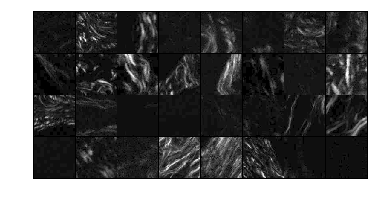

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


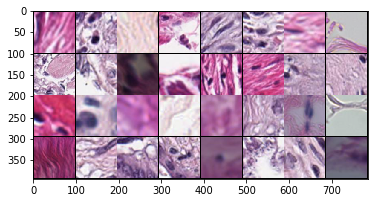

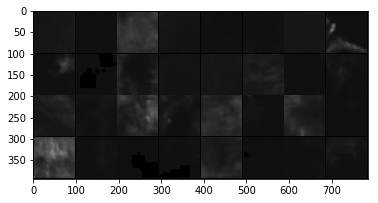

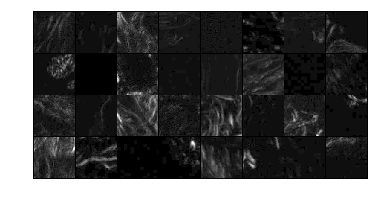

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


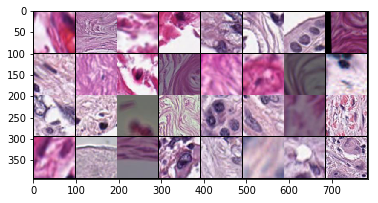

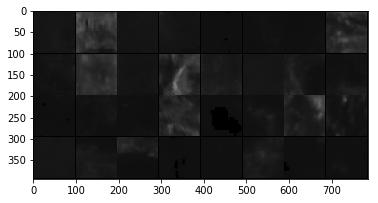

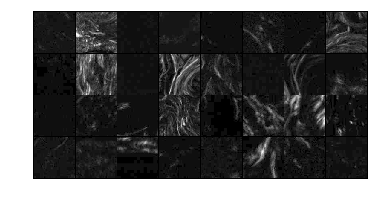

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


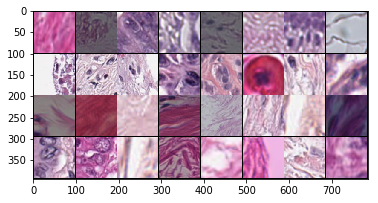

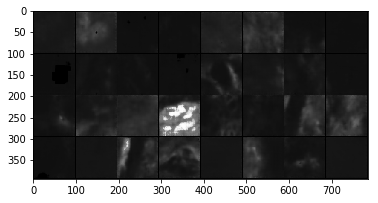

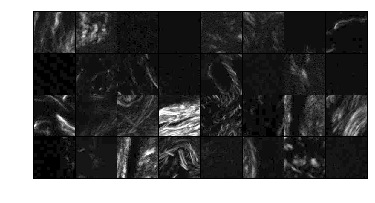

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


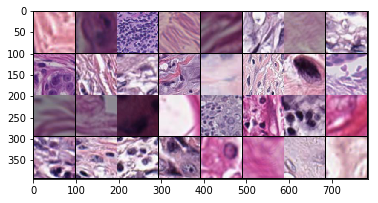

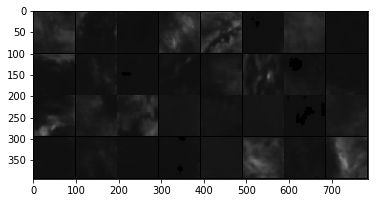

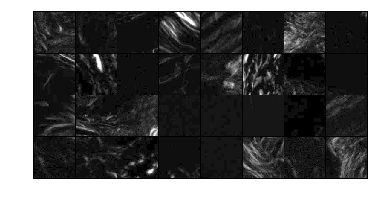

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


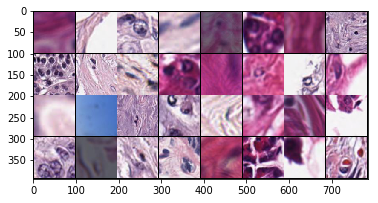

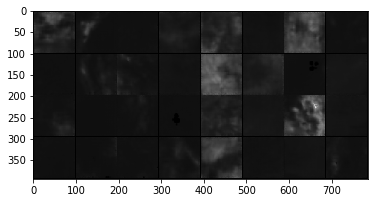

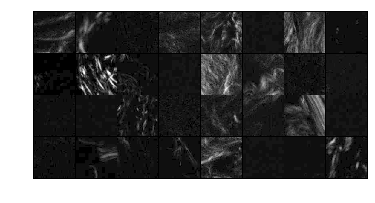

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


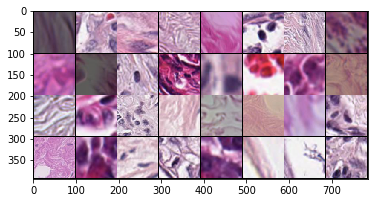

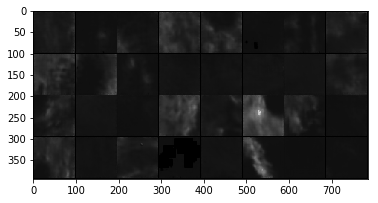

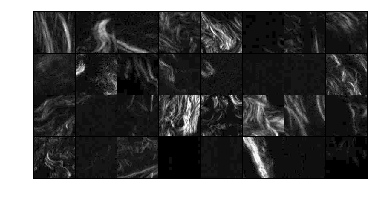

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


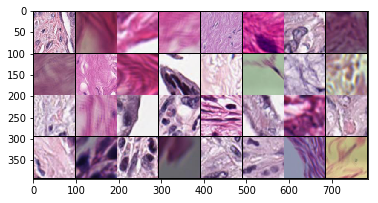

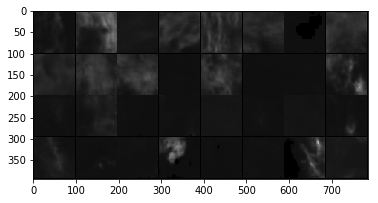

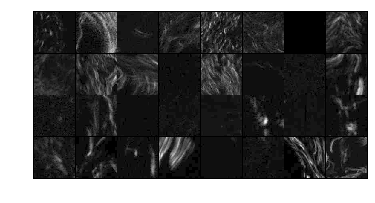

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


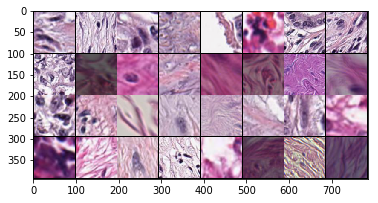

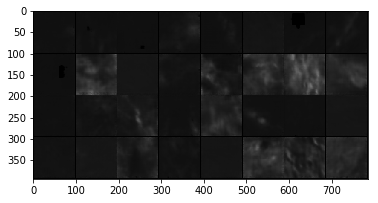

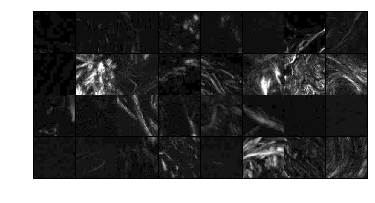

torch.Size([600, 1, 96, 96]) torch.Size([600, 96, 96])
torch.Size([32, 1, 96, 96])


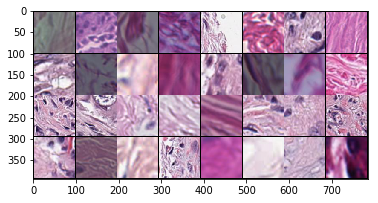

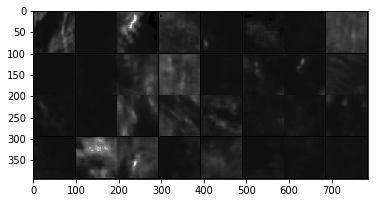

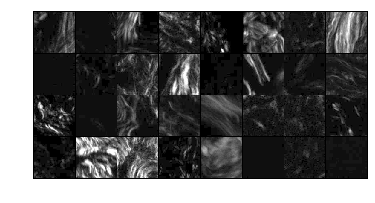

In [24]:
test()